<a href="https://colab.research.google.com/github/katenovita/ecommerce-rfm-analysis/blob/main/eCommerce_RFM_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **eCommerce RFM Analysis and Segmentation Exercise**

based on Kaggle dataset: https://www.kaggle.com/datasets/mkechinov/ecommerce-behavior-data-from-multi-category-store

In [46]:
# For data prep & visualization
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns

# For clustering
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

from google.cloud import bigquery
import google.colab.auth
google.colab.auth.authenticate_user(project_id='kaggle-ecommerce-251121')

# Global notation setting
pd.set_option('display.float_format', '{:2f}'.format)

In [22]:
# 1. Load data
client = bigquery.Client(project='kaggle-ecommerce-251121')

# Load entire main and rfm dataset
table_id = 'kaggle-ecommerce-251121.rfm_stats.main'  # Adjust dataset name if different
df_rfm = client.list_rows(table_id).to_dataframe()

print(df_rfm.head())
print(df_rfm.describe())

     user_id  recency_days  frequency   monetary  avg_order_value  \
0  518514099             2        202  203986.07          1009.83   
1  512386086             0        268  161682.49           603.29   
2  564068124             0        519  131929.20           254.20   
3  515715331             2         80  117130.12          1464.13   
4  521230795             0        120  111072.35           925.60   

   days_active  spend_per_active_day   buyer_type  
0           10              20398.61  Super buyer  
1           29               5575.26  Super buyer  
2           24               5497.05  Super buyer  
3           22               5324.10  Super buyer  
4           14               7933.74  Super buyer  
                user_id  recency_days  frequency       monetary  \
count          441638.0      441638.0   441638.0  441638.000000   
mean   542039787.454723     12.999778   2.076223     623.123215   
std     22727607.099046      7.847598   3.331094    1642.314776   
min  

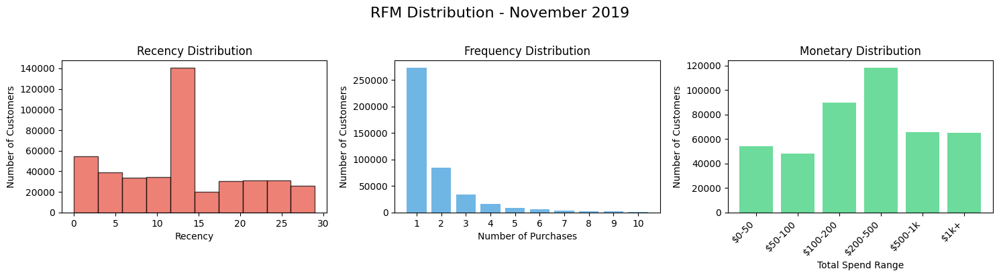

In [55]:
### Check RFM distribution Nov 2019
# Create figure with 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Recency Score Distribution
axes[0].hist(df_rfm['recency_days'], color='#e74c3c', alpha=0.7, edgecolor='black')
axes[0].set_xlabel('Recency')
axes[0].set_ylabel('Number of Customers')
axes[0].set_title('Recency Distribution')

# Frequency - show as bar chart (better for counts)
freq_counts = df_rfm['frequency'].value_counts().sort_index()
# Limit to first 10 values for readability
freq_counts_limited = freq_counts.head(10)

axes[1].bar(freq_counts_limited.index, freq_counts_limited.values,
            color='#3498db', alpha=0.7)
axes[1].set_xlabel('Number of Purchases')
axes[1].set_ylabel('Number of Customers')
axes[1].set_title('Frequency Distribution')
axes[1].set_xticks(freq_counts_limited.index)

# Add count labels on bars
# for i, (idx, val) in enumerate(freq_counts_limited.items()):
#     axes[1].text(idx, val, str(val), ha='center', va='bottom', fontsize=9)

# Monetary
# with custom bins - Create meaningful spend buckets
spend_bins = [0, 50, 100, 200, 500, 1000, df_rfm['monetary'].max()]
spend_labels = ['$0-50', '$50-100', '$100-200', '$200-500', '$500-1k', '$1k+']

df_rfm['spend_bucket'] = pd.cut(df_rfm['monetary'], bins=spend_bins, labels=spend_labels)
spend_counts = df_rfm['spend_bucket'].value_counts().sort_index()

axes[2].bar(range(len(spend_counts)), spend_counts.values,
            color='#2ecc71', alpha=0.7)
axes[2].set_xlabel('Total Spend Range')
axes[2].set_ylabel('Number of Customers')
axes[2].set_title('Monetary Distribution')
axes[2].set_xticks(range(len(spend_counts)))
axes[2].set_xticklabels(spend_labels, rotation=45, ha='right')

# Add count labels
# for i, val in enumerate(spend_counts.values):
#     axes[2].text(i, val, str(val), ha='center', va='bottom', fontsize=9)

plt.suptitle('RFM Distribution - November 2019', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

In [4]:
# RFM Scoring (adjusted for 1-month window)
# Recency: Lower is better (recent purchase)
df_rfm['R_score'] = pd.qcut(
    df_rfm['recency_days'].rank(method='first'),
    q=5,
    labels=[5, 4, 3, 2, 1]  # Reverse: 0 days = score 5
)

# Frequency: Higher is better
df_rfm['F_score'] = pd.qcut(
    df_rfm['frequency'].rank(method='first'),
    q=5,
    labels=[1, 2, 3, 4, 5]
)

# Monetary: Higher is better
df_rfm['M_score'] = pd.qcut(
    df_rfm['monetary'].rank(method='first'),
    q=5,
    labels=[1, 2, 3, 4, 5]
)

### RFM Segmentation with K-Means Clustering

Data shape: (441638, 3)
Features: ['recency_days', 'frequency', 'monetary']

Missing values:
recency_days    0
frequency       0
monetary        0
dtype: int64

After removing missing values: 441,638 customers

Finding optimal number of clusters...

K=2: Inertia=1018400.69
K=3: Inertia=801999.53
K=4: Inertia=524106.67
K=5: Inertia=420909.82
K=6: Inertia=340288.14
K=7: Inertia=301492.51
K=8: Inertia=275301.97
K=9: Inertia=255363.30
K=10: Inertia=239140.49


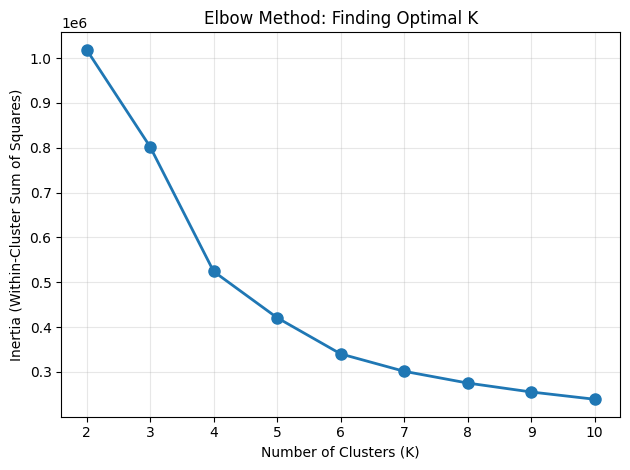

In [57]:
# Step 1: Prepare data for clustering
# Use raw RFM values (not scored)
rfm_features = df_rfm[['recency_days', 'frequency', 'monetary']].copy()

print(f"Data shape: {rfm_features.shape}")
print(f"Features: {rfm_features.columns.tolist()}\n")

# Check for any missing values
print("Missing values:")
print(rfm_features.isnull().sum())

# Remove any rows with missing values
rfm_features = rfm_features.dropna()
print(f"\nAfter removing missing values: {len(rfm_features):,} customers\n")

# Step 2: Standardize the features
# K-means is sensitive to scale - must normalize
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_features)

# Step 3: Find optimal number of clusters (Elbow Method)
print("Finding optimal number of clusters...\n")

inertias = []
K_range = range(2, 11)  # Test 2 to 10 clusters

from sklearn.metrics import silhouette_score

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(rfm_scaled)
    inertias.append(kmeans.inertia_)
    print(f"K={k}: Inertia={kmeans.inertia_:.2f}")

# Visualize elbow curve
#fig, axes = plt.subplots(1, 1, figsize=(14, 5))

# Elbow curve (inertia)
plt.plot(K_range, inertias, marker='o', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia (Within-Cluster Sum of Squares)')
plt.title('Elbow Method: Finding Optimal K')
plt.grid(alpha=0.3)
plt.xticks(K_range)

plt.tight_layout()
plt.show()

In [35]:
# Step 4: Apply K-Means with chosen K

n_clusters = 4  # Change this based on elbow curve

print(f"\nApplying K-Means with K={n_clusters}...\n")

kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
df_rfm['Cluster'] = kmeans.fit_predict(rfm_scaled)

print(f"\nCluster distribution:")
print(df_rfm['Cluster'].value_counts().sort_index())


Applying K-Means with K=4...


Cluster distribution:
Cluster
0    292272
1     12322
2       365
3    136679
Name: count, dtype: int64


In [47]:
### Analyze Cluster Characteristics

# Calculate cluster statistics
cluster_summary = df_rfm.groupby('Cluster').agg({
    'recency_days': 'mean',
    'frequency': 'mean',
    'monetary': {'mean','sum'},
    'user_id': 'count'
}).round(2)

cluster_summary.columns = ['Avg Recency (days)', 'Avg Frequency', 'Avg Monetary', 'Sum Monetary', 'Customer Count']

# Add percentage
cluster_summary['% of Total'] = (
    cluster_summary['Customer Count'] / cluster_summary['Customer Count'].sum() * 100
).round(1)

# Sort by monetary value to see which clusters are most valuable
cluster_summary = cluster_summary.sort_values('Cluster', ascending=True)

print(cluster_summary)

         Avg Recency (days)  Avg Frequency  Avg Monetary     Sum Monetary  \
Cluster                                                                     
0                  8.880000       1.840000    500.880000 146392399.390000   
1                  6.370000      13.040000   5305.940000  65379742.210000   
2                  3.600000      61.880000  34014.610000  12415332.470000   
3                 22.430000       1.440000    373.190000  51007416.430000   

         Customer Count  % of Total  
Cluster                              
0                292272   66.200000  
1                 12322    2.800000  
2                   365    0.100000  
3                136679   30.900000  


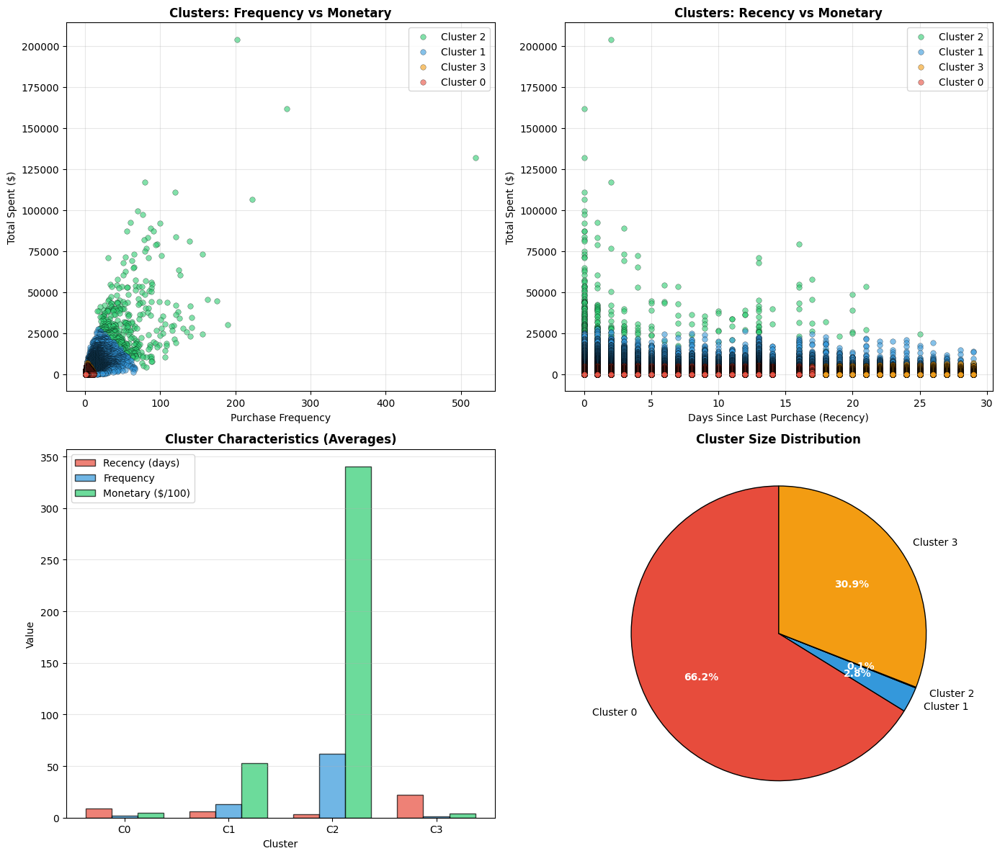


Cluster Distribution:
   Cluster 0: 292,272 customers (66.2%)
   Cluster 1: 12,322 customers (2.8%)
   Cluster 2: 365 customers (0.1%)
   Cluster 3: 136,679 customers (30.9%)

RETARGET LIST: 139001 high-value customers who went quiet mid-month + at-risk


In [48]:
#### Visualize K-Means Clusters

# Segmentation (adjusted for November context)
def segment_november_customer(row):
    c = int(row['Cluster'])

    if c == 0:
        return 'Bread and Butter'
    elif c == 1:
        return 'Loyal High-Spenders'
    elif c == 2:
        return 'The Whales'
    elif c == 3:
        return 'At Risk'
    else:
        return 'Casual Shoppers'

df_rfm['Segment'] = df_rfm.apply(segment_november_customer, axis=1)

# Visualize
fig = px.scatter(
    df_rfm,
    x='frequency',
    y='monetary',
    color='Segment',
    size='recency_days',
    hover_data=['user_id', 'buyer_type'],
    title='November 2019 Customer Segmentation (RFM)',
    labels={'frequency': 'Purchase Count', 'monetary': 'Total Spent ($)'}, #
    size_max=15
)
fig.update_xaxes(range=[0, 250], dtick=50)
fig.show()

# Create 2x2 subplot layout
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Define color palette (one color per cluster)
colors = ['#e74c3c', '#3498db', '#2ecc71', '#f39c12', '#9b59b6', '#1abc9c']

# Chart 1: Scatter - Frequency vs Monetary (most important)
for cluster in df_rfm['Cluster'].unique():
    cluster_data = df_rfm[df_rfm['Cluster'] == cluster]
    axes[0, 0].scatter(
        cluster_data['frequency'],
        cluster_data['monetary'],
        label=f'Cluster {cluster}',
        alpha=0.6,
        s=30,
        color=colors[cluster % len(colors)],
        edgecolors='black',
        linewidth=0.3
    )

axes[0, 0].set_xlabel('Purchase Frequency')
axes[0, 0].set_ylabel('Total Spent ($)')
axes[0, 0].set_title('Clusters: Frequency vs Monetary', fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Chart 2: Scatter - Recency vs Monetary
for cluster in df_rfm['Cluster'].unique():
    cluster_data = df_rfm[df_rfm['Cluster'] == cluster]
    axes[0, 1].scatter(
        cluster_data['recency_days'],
        cluster_data['monetary'],
        label=f'Cluster {cluster}',
        alpha=0.6,
        s=30,
        color=colors[cluster % len(colors)],
        edgecolors='black',
        linewidth=0.3
    )

axes[0, 1].set_xlabel('Days Since Last Purchase (Recency)')
axes[0, 1].set_ylabel('Total Spent ($)')
axes[0, 1].set_title('Clusters: Recency vs Monetary', fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# Chart 3: Cluster Centers (Bar Chart)
cluster_centers = cluster_summary[['Avg Recency (days)', 'Avg Frequency', 'Avg Monetary']].copy()

x = range(len(cluster_centers))
width = 0.25

axes[1, 0].bar([i - width for i in x], cluster_centers['Avg Recency (days)'],
               width, label='Recency (days)', color='#e74c3c', alpha=0.7, edgecolor='black')
axes[1, 0].bar(x, cluster_centers['Avg Frequency'],
               width, label='Frequency', color='#3498db', alpha=0.7, edgecolor='black')
axes[1, 0].bar([i + width for i in x], cluster_centers['Avg Monetary']/100,
               width, label='Monetary ($/100)', color='#2ecc71', alpha=0.7, edgecolor='black')

axes[1, 0].set_xlabel('Cluster')
axes[1, 0].set_ylabel('Value')
axes[1, 0].set_title('Cluster Characteristics (Averages)', fontweight='bold')
axes[1, 0].set_xticks(x)
axes[1, 0].set_xticklabels([f'C{i}' for i in cluster_centers.index])
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3, axis='y')

# Chart 4: Cluster Size Distribution (Pie Chart)
cluster_sizes = cluster_summary['Customer Count']
cluster_pcts = cluster_summary['% of Total']

wedges, texts, autotexts = axes[1, 1].pie(
    cluster_sizes,
    labels=[f'Cluster {i}' for i in cluster_summary.index],
    autopct='%1.1f%%',
    colors=[colors[i % len(colors)] for i in range(len(cluster_sizes))],
    startangle=90,
    wedgeprops={'edgecolor': 'black', 'linewidth': 1}
)

# Make percentage text bold and white
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontsize(10)
    autotext.set_fontweight('bold')

axes[1, 1].set_title('Cluster Size Distribution', fontweight='bold')

#plt.suptitle('K-Means Customer Segmentation Results', fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

# Print cluster sizes
print("\nCluster Distribution:")
for cluster in cluster_summary.index:
    count = cluster_summary.loc[cluster, 'Customer Count']
    pct = cluster_summary.loc[cluster, '% of Total']
    print(f"   Cluster {cluster}: {count:,.0f} customers ({pct:.1f}%)")

# Export for marketing
retarget_list = df_rfm[
    (df_rfm['recency_days'] > 14) &  # Haven't purchased in 2 weeks
    (df_rfm['monetary'] > df_rfm['monetary'].quantile(0.5)) |
    (df_rfm['Segment'] == 'At Risk')# Above median spend
][['user_id', 'monetary', 'frequency', 'recency_days', 'Segment']]

print(f"\nRETARGET LIST: {len(retarget_list)} high-value customers who went quiet mid-month + at-risk")
retarget_list.to_csv('november_retarget_list.csv', index=False)

### Cart Abandonment Recovery Analysis & Scenarios

In [25]:
# Funnel data (based on SQL query)
funnel_data = {
    'sessions_with_views': 49677,
    'sessions_with_cart': 8692,
    'sessions_with_purchase': 5897,
    'view_to_cart_pct': 17.50,
    'cart_to_purchase_pct': 67.84,
    'overall_conversion_pct': 11.87,
    'lost_at_cart': 41106,  # This might be calculated differently
    'lost_at_purchase': 2795,
    'cart_dropoff_pct': 82.50,
    'purchase_dropoff_pct': 32.16
}

print("CART ABANDONMENT RECOVERY POTENTIAL \n")

# Key metrics
abandoned_carts = funnel_data['lost_at_purchase']  # 2,795 sessions added to cart but didn't buy
cart_abandonment_rate = funnel_data['purchase_dropoff_pct']  # 32.16%

print(f"Current Situation:")
print(f"   Sessions with cart: {funnel_data['sessions_with_cart']:,}")
print(f"   Sessions that purchased: {funnel_data['sessions_with_purchase']:,}")
print(f"   Abandoned carts: {abandoned_carts:,}")
print(f"   Cart abandonment rate: {cart_abandonment_rate:.2f}%\n")

# Estimate average cart value
# You'll need to get this from your data, but let's estimate
# Option 1: If you have total revenue from purchases
# avg_cart_value = total_revenue / sessions_with_purchase

=== CART ABANDONMENT RECOVERY POTENTIAL ===

Current Situation:
   Sessions with cart: 8,692
   Sessions that purchased: 5,897
   Abandoned carts: 2,795
   Cart abandonment rate: 32.16%



In [26]:
# Calculate AOV from Your Data

# If you have the daily performance or purchase data loaded
# Option A: From RFM data
if 'df_rfm' in locals():
    avg_order_value = df_rfm['avg_order_value'].mean()
    total_revenue = df_rfm['monetary'].sum()
    print(f"Average Order Value from RFM: ${avg_order_value:.2f}")
    print(f"Total November Revenue: ${total_revenue:,.2f}\n")
else:
    # Option B: Query it from BigQuery
    from google.cloud import bigquery
    client = bigquery.Client(project='kaggle-ecommerce-251121')

    aov_query = """
    SELECT
      AVG(price) as avg_order_value,
      SUM(price) as total_revenue,
      COUNT(*) as total_purchases
    FROM `ABC.your_dataset.events`
    WHERE event_type = 'purchase'
      AND event_time BETWEEN '2019-11-01' AND '2019-11-30'
      AND price IS NOT NULL
    """

    aov_result = client.query(aov_query).to_dataframe()
    avg_order_value = aov_result['avg_order_value'].iloc[0]
    total_revenue = aov_result['total_revenue'].iloc[0]

    print(f"Average Order Value: ${avg_order_value:.2f}")
    print(f"Total November Revenue: ${total_revenue:,.2f}\n")

Average Order Value from RFM: $281.16
Total November Revenue: $275,194,890.50



In [27]:
# CART ABANDONMENT RECOVERY ANALYSIS
# Using Your Actual Data

# Step 1: Get Average Order Value from RFM data
print("STEP 1: Calculate Average Order Value \n")

if 'df_rfm' in locals():
    avg_order_value = df_rfm['avg_order_value'].mean()
    median_order_value = df_rfm['avg_order_value'].median()

    print(f"Average Order Value (AOV): ${avg_order_value:.2f}")
    print(f"Median Order Value: ${median_order_value:.2f}")
    print(f"Based on {len(df_rfm):,} customers from November 2019\n")
else:
    # Fallback if df_rfm not loaded
    print("df_rfm not found. Using estimate...")
    avg_order_value = 120  # Adjust this based on your business

# Step 2: Your funnel data (from the screenshot)
print("STEP 2: Funnel Performance\n")

sessions_with_cart = funnel_data['sessions_with_cart']
sessions_with_purchase = funnel_data['sessions_with_purchase']
abandoned_carts = sessions_with_cart - sessions_with_purchase  # 2,795

abandonment_rate = (abandoned_carts / sessions_with_cart) * 100
conversion_rate = (sessions_with_purchase / sessions_with_cart) * 100

print(f"November 2019 Funnel:")
print(f"   Sessions that added to cart: {sessions_with_cart:,}")
print(f"   Sessions that purchased: {sessions_with_purchase:,}")
print(f"   Abandoned carts: {abandoned_carts:,}")
print(f"   Cart abandonment rate: {abandonment_rate:.2f}%")
print(f"   Cart-to-purchase rate: {conversion_rate:.2f}%\n")

# Step 3: Calculate total abandoned value
total_abandoned_value = abandoned_carts * avg_order_value

print("STEP 3: Abandoned Cart Value \n")
print(f"!!! Total Value at Risk:")
print(f"   {abandoned_carts:,} abandoned carts × ${avg_order_value:.2f} AOV")
print(f"   = ${total_abandoned_value:,.2f} in abandoned cart value\n")


STEP 1: Calculate Average Order Value 

Average Order Value (AOV): $281.16
Median Order Value: $169.92
Based on 441,638 customers from November 2019

STEP 2: Funnel Performance

November 2019 Funnel:
   Sessions that added to cart: 8,692
   Sessions that purchased: 5,897
   Abandoned carts: 2,795
   Cart abandonment rate: 32.16%
   Cart-to-purchase rate: 67.84%

STEP 3: Abandoned Cart Value 

!!! Total Value at Risk:
   2,795 abandoned carts × $281.16 AOV
   = $785,836.75 in abandoned cart value



In [28]:
### SCENARIO ANALYSIS

# Define assumptions of recovery scenarios with costs and expected rates
scenarios = [
    {
        'name': 'Do Nothing (Baseline)',
        'recovery_rate': 0.00,
        'campaign_cost': 0,
        'description': 'No cart recovery efforts',
        'effort': 'None'
    },
    {
        'name': 'Basic Email Sequence',
        'recovery_rate': 0.08,
        'campaign_cost': 500,
        'description': '3 automated emails: 1hr, 24hr, 72hr after abandonment',
        'effort': '1-2 days setup'
    },
    {
        'name': 'Email + 10% Discount',
        'recovery_rate': 0.12,
        'campaign_cost': 1500,  # Includes discount costs
        'description': 'Email sequence with escalating discount (5% → 10%)',
        'effort': '3-5 days setup'
    },
    {
        'name': 'Email + SMS Reminder',
        'recovery_rate': 0.15,
        'campaign_cost': 2000,
        'description': 'Email + SMS for carts >$100, no discount',
        'effort': '1 week setup'
    },
    {
        'name': 'Multi-Channel Standard',
        'recovery_rate': 0.18,
        'campaign_cost': 3500,
        'description': 'Email + SMS + Facebook/Google retargeting + 10% discount',
        'effort': '2 weeks setup'
    },
    {
        'name': 'Multi-Channel Aggressive',
        'recovery_rate': 0.25,
        'campaign_cost': 6000,
        'description': 'All channels + 15% discount + free shipping + urgency (24hr timer)',
        'effort': '3 weeks setup'
    },
    {
        'name': 'Best-in-Class (Optimistic)',
        'recovery_rate': 0.30,
        'campaign_cost': 8000,
        'description': 'Personalized multi-channel + AI timing + dynamic discounts',
        'effort': '1 month setup'
    }
]

# Calculate metrics for each scenario
results = []

for scenario in scenarios:
    recovery_rate = scenario['recovery_rate']
    campaign_cost = scenario['campaign_cost']

    # Calculate outcomes
    recovered_orders = abandoned_carts * recovery_rate
    recovered_revenue = total_abandoned_value * recovery_rate

    # Subtract campaign cost to get net revenue
    net_revenue = recovered_revenue - campaign_cost

    # Calculate ROI
    if campaign_cost > 0:
        roi = (net_revenue / campaign_cost) * 100
    else:
        roi = 0

    # Revenue per abandoned cart
    revenue_per_cart = recovered_revenue / abandoned_carts if abandoned_carts > 0 else 0

    results.append({
        'Scenario': scenario['name'],
        'Recovery Rate': f"{recovery_rate*100:.0f}%",
        'Recovered Orders': f"{recovered_orders:,.0f}",
        'Recovered Revenue': f"${recovered_revenue:,.0f}",
        'Campaign Cost': f"${campaign_cost:,.0f}",
        'Net Revenue': f"${net_revenue:,.0f}",
        'ROI': f"{roi:,.0f}%" if campaign_cost > 0 else "N/A",
        'Description': scenario['description'],
        'Setup Time': scenario['effort']
    })

# Create DataFrame for better display
df_scenarios = pd.DataFrame(results)

print("\nRECOVERY SCENARIOS COMPARISON\n")
print(df_scenarios.to_string(index=False))
print("\n")

df_scenarios.to_csv('recovery_scenarios.csv', index=False)

# Highlight best options
print("RECOMMENDATIONS")

# Find best ROI scenario (excluding "do nothing")
best_roi_idx = 1  # Start from index 1 to skip "Do Nothing"
best_roi = 0

for i in range(1, len(scenarios)):
    rate = scenarios[i]['recovery_rate']
    cost = scenarios[i]['campaign_cost']
    revenue = total_abandoned_value * rate
    net = revenue - cost
    roi = (net / cost) * 100 if cost > 0 else 0

    if roi > best_roi:
        best_roi = roi
        best_roi_idx = i

best_scenario = scenarios[best_roi_idx]

print(f"BEST ROI SCENARIO: {best_scenario['name']}")
print(f"   • Recovery rate: {best_scenario['recovery_rate']*100:.0f}%")
print(f"   • Recovered revenue: ${total_abandoned_value * best_scenario['recovery_rate']:,.2f}")
print(f"   • Campaign cost: ${best_scenario['campaign_cost']:,.2f}")
print(f"   • Net revenue: ${(total_abandoned_value * best_scenario['recovery_rate']) - best_scenario['campaign_cost']:,.2f}")
print(f"   • ROI: {best_roi:.0f}%")
print(f"   • Setup time: {best_scenario['effort']}")
print(f"   • What it includes: {best_scenario['description']}")


RECOVERY SCENARIOS COMPARISON

                  Scenario Recovery Rate Recovered Orders Recovered Revenue Campaign Cost Net Revenue     ROI                                                        Description     Setup Time
     Do Nothing (Baseline)            0%                0                $0            $0          $0     N/A                                           No cart recovery efforts           None
      Basic Email Sequence            8%              224           $62,867          $500     $62,367 12,473%              3 automated emails: 1hr, 24hr, 72hr after abandonment 1-2 days setup
      Email + 10% Discount           12%              335           $94,300        $1,500     $92,800  6,187%                 Email sequence with escalating discount (5% → 10%) 3-5 days setup
      Email + SMS Reminder           15%              419          $117,876        $2,000    $115,876  5,794%                           Email + SMS for carts >$100, no discount   1 week setup
    Mult

In [68]:
### VISUALIZATION: Compare Scenarios

# Prepare data for visualization (exclude "Do Nothing")
scenario_names = [s['name'] for s in scenarios[1:]]  # Skip "Do Nothing"
recovery_rates = [s['recovery_rate'] * 100 for s in scenarios[1:]]
recovered_revenues = [total_abandoned_value * s['recovery_rate'] for s in scenarios[1:]]
campaign_costs = [s['campaign_cost'] for s in scenarios[1:]]
net_revenues = [recovered_revenues[i] - campaign_costs[i] for i in range(len(campaign_costs))]
rois = [(net_revenues[i] / campaign_costs[i]) * 100 if campaign_costs[i] > 0 else 0
        for i in range(len(campaign_costs))]

# Create subplots
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=(
        'Recovery Rate by Scenario',
        'Net Revenue by Scenario',
        'Campaign Cost vs Recovered Revenue',
        'ROI by Scenario'
    ),
    specs=[
        [{'type': 'bar'}, {'type': 'bar'}],
        [{'type': 'scatter'}, {'type': 'bar'}]
    ]
)

# Chart 1: Recovery Rates
fig.add_trace(
    go.Bar(
        x=scenario_names,
        y=recovery_rates,
        name='Recovery Rate',
        marker_color='lightsalmon',
        text=[f"{r:.0f}%" for r in recovery_rates],
        textposition='outside'
    ),
    row=1, col=1
)

# Chart 2: Net Revenue
fig.add_trace(
    go.Bar(
        x=scenario_names,
        y=net_revenues,
        name='Net Revenue',
        marker_color='lightseagreen',
        text=[f"${nr/1000:.0f}K" for nr in net_revenues],
        textposition='outside'
    ),
    row=1, col=2
)

# Chart 3: Cost vs Revenue Scatter
fig.add_trace(
    go.Scatter(
        x=campaign_costs,
        y=recovered_revenues,
        mode='markers+text',
        name='Scenarios',
        marker=dict(size=15, color=rois, colorscale='Viridis', showscale=False,
                   colorbar=dict(title="ROI %", x=1.15)),
        text=[s.replace(' ', '<br>') for s in scenario_names],
        textposition='top center',
        textfont=dict(size=8)
    ),
    row=2, col=1
)

# Add diagonal reference line (break-even)
max_val = max(max(campaign_costs), max(recovered_revenues))
fig.add_trace(
    go.Scatter(
        x=[0, max_val],
        y=[0, max_val],
        mode='lines',
        line=dict(dash='dash', color='red'),
        name='Break-even',
        showlegend=False
    ),
    row=2, col=1
)

# Chart 4: ROI
colors = ['#d62728' if roi < 0 else '#2ca02c' for roi in rois]
fig.add_trace(
    go.Bar(
        x=scenario_names,
        y=rois,
        name='ROI',
        marker_color=colors,
        text=[f"{roi:.0f}%" for roi in rois],
        textposition='outside'
    ),
    row=2, col=2
)

# Update layout
fig.update_xaxes(tickangle=45, row=1, col=1)
fig.update_xaxes(tickangle=45, row=1, col=2)
fig.update_xaxes(title_text="Campaign Cost ($)", row=2, col=1)
fig.update_xaxes(tickangle=45, row=2, col=2)

fig.update_yaxes(title_text="Recovery Rate (%)", row=1, col=1)
fig.update_yaxes(title_text="Net Revenue ($)", row=1, col=2)
fig.update_yaxes(title_text="Recovered Revenue ($)", row=2, col=1)
fig.update_yaxes(title_text="ROI (%)", row=2, col=2)

fig.update_layout(
    title_text="Cart Abandonment Recovery Scenario Analysis",
    height=1200,
    showlegend=False
)

fig.show()